## Исследование города в разрезе транспортной безопасности и основных причин ДТП

## Цель:
Проанализировать по статистическим данным транспортную безопасность 

## Источник данных: 
Сайт некоммерческого проекта «Карта ДТП»  ([https://dtp-stat.ru/opendata](https://dtp-stat.ru/opendata))


## 1. Анализ исторических данных:
- Внешние условия в момент ДТП. Когда происходит больше аварий и почему:
    - Время суток
    - Сезон
    - Срез по годам и месяцам за все время
- Последствия:
    - Категория ДТП
    - Тяжесть ДТП (легкая и тд.)
- Водитель:
    - Пол
    - Стаж вождения
    - В аварии какой степени тяжести попадают водители мужчины и водители женщины?
- Ситуация в городе:
    - В каких районе города происходит больше всего ДТП? Изучить самостоятельно причины.
    - Посмотреть в динамике, в каких районах количество аварий сокращается, а где увеличивается (можно выделить топ-5 районов)
    - В каких районах было больше случаев со смертельным исходом и почему. В каких меньше.
    - В каких районах города участники ДТП чаще получают травмы?

## 2. Визуализация на карте 
- Визуализировать на карте ДТП в городе с помощью heatmap (за все время):
    - Районы по количеству ДТП
- Визуализировать на карте ДТП района точками за год:
    - Аварии по сезонам
    - Аварии, где водитель мужчина и водитель женщины
    - Аварии по степени тяжести

In [1]:
#!pip install folium
#!pip install geopandas
#!pip install geopy

In [2]:
import geopandas as gpd
import pandas as pd
import json
import fiona
from ast import literal_eval
import geopy
from geopy.geocoders import Nominatim
geopy.geocoders.options.default_timeout = 7

import datetime as dt
from datetime import date, datetime

import folium
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# максимальная ширина столбца = 150
pd.options.display.max_colwidth = 150
# все столбцы
pd.set_option('display.max_columns', None)

### Откроем файл по городу Москва с помощью geopandas

In [3]:
df = gpd.read_file('D:\IT\Pet_projects\\2_Geoanalis\moskva.geojson')
df.info()
df.tail(1)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   id                  70475 non-null  int64         
 1   light               70475 non-null  object        
 2   point               70475 non-null  object        
 3   region              70475 non-null  object        
 4   scheme              68299 non-null  object        
 5   address             65857 non-null  object        
 6   category            70475 non-null  object        
 7   datetime            70475 non-null  datetime64[ns]
 8   severity            70475 non-null  object        
 9   vehicles            70475 non-null  object        
 10  dead_count          70475 non-null  int64         
 11  participants        70475 non-null  object        
 12  injured_count       70475 non-null  int64         
 13  parent_region       70475 non-null  ob

,id,light,point,region,scheme,address,category,datetime,severity,vehicles,dead_count,participants,injured_count,parent_region,participants_count,geometry
70474,1529108,Светлое время суток,"{'lat': 55.758448, 'long': 37.750729}",Соколиная гора,840,None,Наезд на пешехода,2019-06-10 19:30:00,Легкий,"[ { ""year"": 1997, ""brand"": ""FORD"", ""color"": ""Черный"", ""model"": ""Expedition"", ""category"": ""Минивэны и универсалы повышенной вместимости"", ""particip...",0,"[ { ""role"": ""Пешеход"", ""gender"": ""Мужской"", ""violations"": [ ], ""health_status"": ""Раненый, находящийся (находившийся) на амбулаторном лечении, либ...",1,Москва,2,POINT (37.75073 55.75845)


In [4]:
# parent_region - родительский, основной регион. Значение единственное- Москва. Удалим столбец
df.drop('parent_region', axis=1, inplace=True)

Есть пропуски в столбцах:
- scheme (схема),
- address (адрес),
- geometry (геометрия).

Есть вложенные столбцы типа json:
- vehicles (транспортные средства),
- participants (участники).

И столбец point- словарь- долгота, ширина

In [5]:
# Посмотрим столбец vehicles сколько вложений
df['vehicles'][70474]

'[ { "year": 1997, "brand": "FORD", "color": "Черный", "model": "Expedition", "category": "Минивэны и универсалы повышенной вместимости", "participants": [ { "role": "Водитель", "gender": "Мужской", "violations": [ "Несоблюдение бокового интервала", "Другие нарушения ПДД водителем" ], "health_status": "Не пострадал", "years_of_driving_experience": 13 } ] } ]'

In [6]:
# И столбец participants
df['participants'][70474]

'[ { "role": "Пешеход", "gender": "Мужской", "violations": [ ], "health_status": "Раненый, находящийся (находившийся)  на амбулаторном лечении, либо которому по характеру полученных травм обозначена необходимость амбулаторного лечения (вне зависимости от его фактического прохождения)" } ]'

Интересно, что в столбце vehicles есть вложение со словарем participants. Но если их сравнить, они разные с ролью пешехода и водителя.

Поработаем с participants основной таблицы

In [7]:
df['participants'] = (
    df['participants']
    .str.replace('null', 'None')
    .apply(literal_eval)
    .explode(ignore_index=True)
    .fillna({i: {} for i in df.index})
)
df1 = pd.json_normalize(df['participants'])
df1.info()
df1.sample(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   role           26068 non-null  object
 1   gender         25701 non-null  object
 2   violations     26068 non-null  object
 3   health_status  26067 non-null  object
dtypes: object(4)
memory usage: 2.2+ MB


,role,gender,violations,health_status
59856,NaN,NaN,NaN,NaN
61263,NaN,NaN,NaN,NaN
24657,NaN,NaN,NaN,NaN


In [8]:
# Переименуем с добавлением префикса
df1 = df1.add_suffix('_1')
df1.columns

Index(['role_1', 'gender_1', 'violations_1', 'health_status_1'], dtype='object')

Раскроем столбец vehicles

In [9]:
df['vehicles'] = (
    df['vehicles']
    .fillna('[]')
    .str.replace('null', 'None')
    .apply(literal_eval)
    .explode(ignore_index=True)
    .fillna({i: {} for i in df.index})
)
df2 = pd.json_normalize(df['vehicles'])
df2.info()
df2.head(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          68171 non-null  float64
 1   brand         68223 non-null  object 
 2   color         69309 non-null  object 
 3   model         68222 non-null  object 
 4   category      70295 non-null  object 
 5   participants  70295 non-null  object 
dtypes: float64(1), object(5)
memory usage: 3.2+ MB


,year,brand,color,model,category,participants
0,2013.0,AUDI,Серый,А4,"С-класс (малый средний, компактный) до 4,3 м","[{'role': 'Водитель', 'gender': 'Мужской', 'violations': ['Нарушение требований сигналов светофора'], 'health_status': 'Не пострадал', 'years_of_d..."
1,2008.0,HYUNDAI,Серый,Sonata,"D-класс (средний) до 4,6 м","[{'role': 'Водитель', 'gender': 'Мужской', 'violations': [], 'health_status': 'Не пострадал', 'years_of_driving_experience': 9}, {'role': 'Пассажи..."
2,2014.0,KIA,Черный,Прочие модели KIA,"В-класс (малый) до 3,9 м","[{'role': 'Водитель', 'gender': 'Мужской', 'violations': ['Нарушение требований сигналов светофора'], 'health_status': 'Раненый, находящийся (нахо..."


In [10]:
# Переименуем с добавлением префикса
df2 = df2.add_suffix('_vehicles')
df2.columns

Index(['year_vehicles', 'brand_vehicles', 'color_vehicles', 'model_vehicles',
       'category_vehicles', 'participants_vehicles'],
      dtype='object')

In [11]:
df2['participants_vehicles'][0]

[{'role': 'Водитель',
  'gender': 'Мужской',
  'violations': ['Нарушение требований сигналов светофора'],
  'health_status': 'Не пострадал',
  'years_of_driving_experience': 4}]

Раскроем столбец participants_vehicles

In [12]:
df2['participants_vehicles'] = (
    df2['participants_vehicles']
    .fillna('[]')
    .explode(ignore_index=True)
    .fillna({i: {} for i in df.index})    
)
df3 = pd.json_normalize(df2['participants_vehicles'])
df3.info()
df3.head(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   role                         70343 non-null  object 
 1   gender                       69667 non-null  object 
 2   violations                   70343 non-null  object 
 3   health_status                70256 non-null  object 
 4   years_of_driving_experience  53278 non-null  float64
dtypes: float64(1), object(4)
memory usage: 2.7+ MB


,role,gender,violations,health_status,years_of_driving_experience
0,Водитель,Мужской,[Нарушение требований сигналов светофора],Не пострадал,4.0
1,Водитель,Мужской,[],Не пострадал,9.0
2,Пассажир,Женский,[],"Раненый, находящийся (находившийся) на амбулаторном лечении, либо которому по характеру полученных травм обозначена необходимость амбулаторного л...",NaN


In [13]:
# Переименуем с добавлением префикса
df3 = df3.add_suffix('_vehicles')
df3.columns

Index(['role_vehicles', 'gender_vehicles', 'violations_vehicles',
       'health_status_vehicles', 'years_of_driving_experience_vehicles'],
      dtype='object')

Объединим таблицы

In [14]:
# Таблица из столбца vehicles
df4 = (
    df2
    .drop(['participants_vehicles'], axis=1)
    .join(df3)
)
df4.info()
df4.head(1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   year_vehicles                         68171 non-null  float64
 1   brand_vehicles                        68223 non-null  object 
 2   color_vehicles                        69309 non-null  object 
 3   model_vehicles                        68222 non-null  object 
 4   category_vehicles                     70295 non-null  object 
 5   role_vehicles                         70343 non-null  object 
 6   gender_vehicles                       69667 non-null  object 
 7   violations_vehicles                   70343 non-null  object 
 8   health_status_vehicles                70256 non-null  object 
 9   years_of_driving_experience_vehicles  53278 non-null  float64
dtypes: float64(2), object(8)
memory usage: 5.4+ MB


,year_vehicles,brand_vehicles,color_vehicles,model_vehicles,category_vehicles,role_vehicles,gender_vehicles,violations_vehicles,health_status_vehicles,years_of_driving_experience_vehicles
0,2013.0,AUDI,Серый,А4,"С-класс (малый средний, компактный) до 4,3 м",Водитель,Мужской,[Нарушение требований сигналов светофора],Не пострадал,4.0


In [15]:
# Присоединим все к основной таблице
df.drop({'participants', 'vehicles'}, axis=1, inplace=True)
full = (
    df
    .join(df1)
    .join(df4)
)

full.info()
full.sample(1)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 27 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   id                                    70475 non-null  int64         
 1   light                                 70475 non-null  object        
 2   point                                 70475 non-null  object        
 3   region                                70475 non-null  object        
 4   scheme                                68299 non-null  object        
 5   address                               65857 non-null  object        
 6   category                              70475 non-null  object        
 7   datetime                              70475 non-null  datetime64[ns]
 8   severity                              70475 non-null  object        
 9   dead_count                            70475 non-null  int64     

,id,light,point,region,scheme,address,category,datetime,severity,dead_count,injured_count,participants_count,geometry,role_1,gender_1,violations_1,health_status_1,year_vehicles,brand_vehicles,color_vehicles,model_vehicles,category_vehicles,role_vehicles,gender_vehicles,violations_vehicles,health_status_vehicles,years_of_driving_experience_vehicles
5325,1560615,Светлое время суток,"{'lat': 55.665459, 'long': 37.740097}",Люблино,830,None,Наезд на пешехода,2020-08-08 23:30:00,Легкий,0,1,2,POINT (37.74010 55.66546),Пешеход,Женский,[],"Раненый, находящийся (находившийся) на амбулаторном лечении, либо которому по характеру полученных травм обозначена необходимость амбулаторного л...",2013.0,PEUGEOT,Белый,Прочие модели Peugeot,Фургоны,Водитель,Мужской,[Несоответствие скорости конкретным условиям движения],"Раненый, находящийся (находившийся) на амбулаторном лечении, либо которому по характеру полученных травм обозначена необходимость амбулаторного л...",18.0


Посмотрим что у нас есть.
* id - номер события
* light - время суток, освещенность дорог
* point и geometry - точка локации. Если их обработать выйдет ширина и долгота
* region - район
* scheme - схема (пока не понятны номера)
* address - адрес
* category - категория
* datetime - дата время
* severity - строгость, тяжесть происшествия
* dead_count - количество погибших
* injured_count - количество людей, получивших травму
* participants_count - количество участников
* role_2 - роль
* gender_2 - пол
* violations_2 - нарушения
* health_status_2 - статус здоровья
* year_vehicles - год выпуска автомобилей
* brand_vehicles - бренд, марка авто
* color_vehicles - цвет авто
* model_vehicles - модель, класс авто
* category_vehicles - категория авто, включает модель и размеры авто
* role_vehicles - вторая роль, кто вел транспортное средство или другое (см. роль первую)
* gender_vehicles - второй пол
* violations_vehicles - нарушение- второе значение
* health_status_vehicles - статус здоровья- второе значение
* years_of_driving_experience_vehicles - сколько лет опыта вождения

Поработаем с точками геолокации

In [16]:
point = full['point'].apply(pd.Series)
point.info()
point.head(1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   lat     70392 non-null  float64
 1   long    70392 non-null  float64
dtypes: float64(2)
memory usage: 1.1 MB


,lat,long
0,55.6875,37.5733


In [17]:
# Добавим в общую таблицу и посмотрим есть ли данные по столбцу geometry
full = (
    full
    .drop({'point', 'geometry'}, axis=1)
    .join(point)
)
print("Количество пропусков:\n", full.isna().sum())

Количество пропусков:
 id                                          0
light                                       0
region                                      0
scheme                                   2176
address                                  4618
category                                    0
datetime                                    0
severity                                    0
dead_count                                  0
injured_count                               0
participants_count                          0
role_1                                  44407
gender_1                                44774
violations_1                            44407
health_status_1                         44408
year_vehicles                            2304
brand_vehicles                           2252
color_vehicles                           1166
model_vehicles                           2253
category_vehicles                         180
role_vehicles                             132
gender_vehi

83 пропуска в локациях. Выделим точки из столбца адреса

In [18]:
address = full[['address', 'lat', 'long']]
address.info()
print('---------------------------------------')
print("Количество пропусков:\n", address.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   address  65857 non-null  object 
 1   lat      70392 non-null  float64
 2   long     70392 non-null  float64
dtypes: float64(2), object(1)
memory usage: 1.6+ MB
---------------------------------------
Количество пропусков:
 address    4618
lat          83
long         83
dtype: int64


In [19]:
# Посмотрим сколько пропусков можем заполнить, обрабатывая адреса.
address_nan = address.loc[address['long'].isna()]
address_nan = address_nan.loc[address_nan['address'].notna()]
print('Размер таблицы с пропусками в локации:', address_nan.shape)

Размер таблицы с пропусками в локации: (69, 3)


У нас 69 адресов, по которым можем вытащить точки локации.

In [20]:
# Для дальнейшей визуализации потребуются географические координаты. Выделим их.
geolocator = Nominatim(user_agent = 'app1')
geolocator.geocode("Москва, улица Матвеевская, 10к2").raw

{'place_id': 111177392,
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. https://osm.org/copyright',
 'osm_type': 'way',
 'osm_id': 27787803,
 'boundingbox': ['55.7032537', '55.7049834', '37.4719919', '37.4736258'],
 'lat': '55.7040948',
 'lon': '37.47278823349885',
 'display_name': '10 к2, Матвеевская улица, Матвеевское, район Очаково-Матвеевское, Москва, Центральный федеральный округ, 119517, Россия',
 'class': 'building',
 'type': 'apartments',
 'importance': 0.31010000000000004}

Адрес написан не правильно, поэтому не считывается

In [21]:
# Обработаем столбец адрес
address_nan['address'] = (
    address_nan['address']
    .replace({
        "г ": "", 
        "ул ": "улица ", 
        " корп. ": "к",
        ",к": "к",
        ", корпус ": "к",
        "пл ": "площадь ",
        "ш ": "шоссе ",
        "б-р ": "бульвар ",
        "п ": "посёлок ",
        "пр-кт ": "проспект ",
        "пер ": "переулок ",
        "д ": "деревня ",
        " Б.,": " Большая,",
        " 2 Г": " вл2Г"
        }, regex=True)
)
address_nan['address'] = (
    address_nan['address']
    .replace({
        "проездеревня ": "проезд ",
        " 14б": " 14Б",
        }, regex=True)
)
address_nan.sample(3)

,address,lat,long
53712,"деревня Сосенки, улица Сосновая, 3Б",NaN,NaN
67154,"Москва, шоссе Можайское, 50",NaN,NaN
42562,"Москва, улица Летчика Грицевца (посёлок Внуковское), 11",NaN,NaN


In [22]:
address_nan['address'].unique()

array(['Москва, улица Матвеевская, 10к2',
       'Москва, шоссе Ленинградское, 110',
       'Москва, улица Центральная, 12-4А', 'посёлок Щапово, улица Лесная',
       'Москва, площадь Сухаревская Большая, 14-7',
       'Щербинка, улица Остафьевская, 1',
       'Москва, улица Садовая-Кудринская, 23',
       'деревня Кузнецово, улица Центральная, 10',
       'деревня Румянцево, улица Центральная, 85',
       'Москва, проспект Мичуринский, 9',
       'Москва, улица Дорогомиловская Большая, 1',
       'Москва, улица Удальцова, 38', 'Москва, шоссе Боровское, 2',
       'Москва, бульвар Зубовский, 31-33',
       'Москва, шоссе Ленинградское, 14',
       'деревня Яковлевское, улица Центральная, 22',
       'Троицк, переулок Парковый, 2',
       'Москва, км Калужское шоссе 22-й (посёлок Сосенское), 2',
       'Москва, улица Сущёвский Вал, 46', 'Москва, улица Минская, 3',
       'Москва, улица Азовская, 21', 'Москва, шоссе Шереметьевское, 6км',
       'Москва, площадь Смоленская, 13-21',
      

In [23]:
# Для дальнейшей визуализации потребуются географические координаты. Выделим их.
geolocator = Nominatim(user_agent = 'app2')

# Широта
def get_latitude(cell):
    try:
        location = geolocator.geocode(cell)
        return location.latitude
    except:
        return np.nan
address_nan['lat'] = address_nan['address'].apply(get_latitude)
print('Посмотрим какие адреса не сработали, остались пропуски в столбце latitude:')
address_nan.loc[address_nan['lat'].isna()]

Посмотрим какие адреса не сработали, остались пропуски в столбце latitude:


,address,lat,long
5104,"посёлок Щапово, улица Лесная",NaN,NaN
5341,"деревня Кузнецово, улица Центральная, 10",NaN,NaN
5500,"деревня Румянцево, улица Центральная, 85",NaN,NaN
23454,"деревня Яковлевское, улица Центральная, 22",NaN,NaN
25169,"Москва, км Калужское шоссе 22-й (посёлок Сосенское), 2",NaN,NaN
42018,"деревня Крекшино, улица Советская, 31",NaN,NaN
42562,"Москва, улица Летчика Грицевца (посёлок Внуковское), 11",NaN,NaN
42681,"посёлок Рогово, улица Заречная, 14Б",NaN,NaN
45203,"Москва, М-3 Украина Москва - Калуга - Брянск - граница с Украиной (основное направление), 56 км",NaN,NaN
52605,"М-9 Балтия Москва - Волоколамск - граница с Латвийской Республикой, 18 км",NaN,NaN


In [24]:
# Долгота
def get_longitude(cell):
    try:
        location = geolocator.geocode(cell)
        return location.longitude
    except:
        return np.nan

address_nan['long'] = address_nan['address'].apply(get_latitude)
print('Количество пропусков в столбце longitude: {} из {}.'.format(
    address_nan['long'].isna().sum(), address_nan.shape[0]))
address_nan.sample(3)

Количество пропусков в столбце longitude: 14 из 69.


,address,lat,long
29851,"Москва, шоссе Шереметьевское, 6км",55.982580,55.982580
5276,"Москва, улица Садовая-Кудринская, 23",55.766055,55.766055
2438,"Москва, улица Центральная, 12-4А",56.028289,56.028289


In [25]:
# Вложим обработанные локации
address.update(address_nan, errors='ignore')
address.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   address  65857 non-null  object 
 1   lat      70447 non-null  float64
 2   long     70447 non-null  float64
dtypes: float64(2), object(1)
memory usage: 1.6+ MB


C:\Users\nikit\AppData\Local\Temp\ipykernel_7804\732809179.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address.update(address_nan, errors='ignore')
C:\Users\nikit\AppData\Local\Temp\ipykernel_7804\732809179.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address.update(address_nan, errors='ignore')
C:\Users\nikit\AppData\Local\Temp\ipykernel_7804\732809179.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = v

Остались пропуски в адресах. Теперь от противного- из локационных точек выделим адрес

In [26]:
def get_address(cell):
    return geolocator.reverse(cell)
    
#address['lat_long'] = address['lat'].astype('str') + ', ' + address['long'].astype('str')

# Таблица с пропусками в адресе и при наличии точек локации
find_address = (
    address
    .loc[address['address'].isna()]
    .loc[address['lat'].notna()]
)
find_address['lat_long'] = find_address['lat'].astype('str') + ', ' + find_address['long'].astype('str')
#find_address['address_find'] = find_address['lat_long'].apply(lambda x: geolocator.reverse(x))

#display(find_address['lat_long'].head(2))
find_address.info()
find_address.head(2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4604 entries, 28 to 70474
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   address   0 non-null      object 
 1   lat       4604 non-null   float64
 2   long      4604 non-null   float64
 3   lat_long  4604 non-null   object 
dtypes: float64(2), object(2)
memory usage: 179.8+ KB


,address,lat,long,lat_long
28,None,55.798600,37.889200,"55.7986, 37.8892"
51,None,55.600556,37.478056,"55.600556, 37.478056"


In [27]:
l =[]
for row in find_address['lat_long']:
    location = geolocator.reverse(row)
    l.append(location.address)

In [28]:
list_address = pd.DataFrame(l, index= find_address.index, columns=['address'])
list_address.info()
list_address.head(1)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4604 entries, 28 to 70474
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   address  4604 non-null   object
dtypes: object(1)
memory usage: 71.9+ KB


,address
28,"Детский сад комбинированного вида № 51 ""Аленький цветочек"", Центральный проезд, Новое Измайлово, Балашиха, городской округ Балашиха, Московская об..."


In [29]:
address.loc[address['address'].isna(), 'address'] = list_address.loc[list_address['address'].notna(), 'address']
address.info()
address.sample(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   address  70461 non-null  object 
 1   lat      70447 non-null  float64
 2   long     70447 non-null  float64
dtypes: float64(2), object(1)
memory usage: 1.6+ MB


,address,lat,long
19571,"г Московский, ул Хабарова, 2",55.000000,37.000000
56781,"г Москва, пр-кт Волгоградский, 40",55.715804,37.710453
57470,"п Ухтомский, ш Косинское, 2км",55.709059,37.870452


In [30]:
# Объединим таблицы
full = (
    full
    .drop({'address', 'lat', 'long'}, axis=1)
    .join(address)
)
full.info()
full.sample()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 27 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   id                                    70475 non-null  int64         
 1   light                                 70475 non-null  object        
 2   region                                70475 non-null  object        
 3   scheme                                68299 non-null  object        
 4   category                              70475 non-null  object        
 5   datetime                              70475 non-null  datetime64[ns]
 6   severity                              70475 non-null  object        
 7   dead_count                            70475 non-null  int64         
 8   injured_count                         70475 non-null  int64         
 9   participants_count                    70475 non-null  int64         
 10

,id,light,region,scheme,category,datetime,severity,dead_count,injured_count,participants_count,role_1,gender_1,violations_1,health_status_1,year_vehicles,brand_vehicles,color_vehicles,model_vehicles,category_vehicles,role_vehicles,gender_vehicles,violations_vehicles,health_status_vehicles,years_of_driving_experience_vehicles,address,lat,long
31607,1546480,Светлое время суток,Отрадное,740,Наезд на пешехода,2020-06-11 21:23:00,Легкий,0,1,2,NaN,NaN,NaN,NaN,2013.0,CHEVROLET,Белый,Cobalt,"А-класс (особо малый) до 3,5 м",Водитель,Женский,[Невыполнение требований обеспечения безопасности при начале движения],Не пострадал,16.0,"г Москва, проезд Юрловский, 25",55.874239,37.614377


## Анализ исторических данных:
### 1. Внешние условия в момент ДТП. 
- **Когда происходит больше аварий и почему:**
    - Время суток
    - Сезон
    - Срез по годам и месяцам за все время

In [31]:
# Для этого необходимо обработать столбец datetime
full['year'] = pd.DatetimeIndex(full['datetime']).year
full['month'] = full['datetime'].dt.month

# Сезон
seasons = {(1, 12, 2): 'winter', (3, 4, 5): 'spring', (6, 7, 8): 'summer', (9, 10, 11): 'autumn'}
def get_season(ser):
    for k in seasons.keys():
        if ser in k:
            return seasons[k]

full['season'] = full['month'].apply(get_season)
full.sample(1)

,id,light,region,scheme,category,datetime,severity,dead_count,injured_count,participants_count,role_1,gender_1,violations_1,health_status_1,year_vehicles,brand_vehicles,color_vehicles,model_vehicles,category_vehicles,role_vehicles,gender_vehicles,violations_vehicles,health_status_vehicles,years_of_driving_experience_vehicles,address,lat,long,year,month,season
21569,1574637,Светлое время суток,Чертаново Центральное,820,Наезд на пешехода,2018-12-01 15:30:00,Легкий,0,1,2,Пешеход,Женский,[],"Раненый, находящийся (находившийся) на амбулаторном лечении, либо которому по характеру полученных травм обозначена необходимость амбулаторного л...",2017.0,HYUNDAI,Серый,Creta,"С-класс (малый средний, компактный) до 4,3 м",Водитель,Мужской,[],"Раненый, находящийся (находившийся) на амбулаторном лечении, либо в условиях дневного стационара",5.0,"г Москва, ул Кировоградская, 15А",55.610323,37.603101,2018,12,winter



По критерию "year"


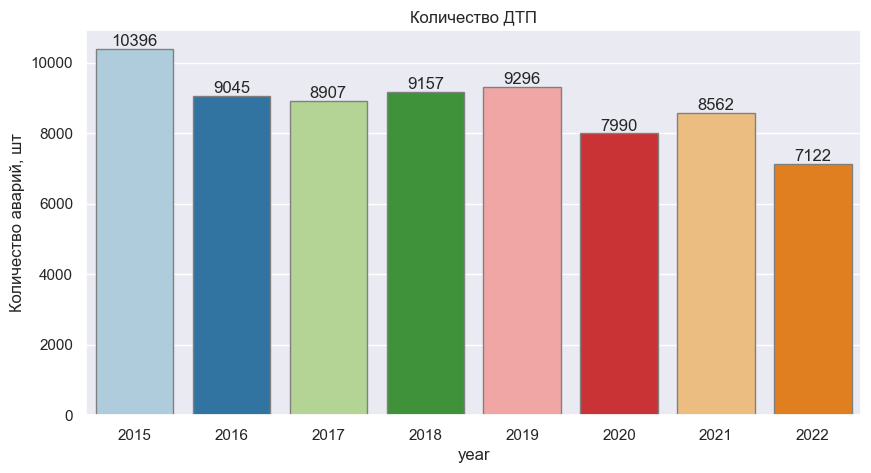

Максимальное значение ДТП= 10396 шт. в 2015, 
минимальное = 7122 шт. в 2022
------------------------------------------------------

По критерию "month"


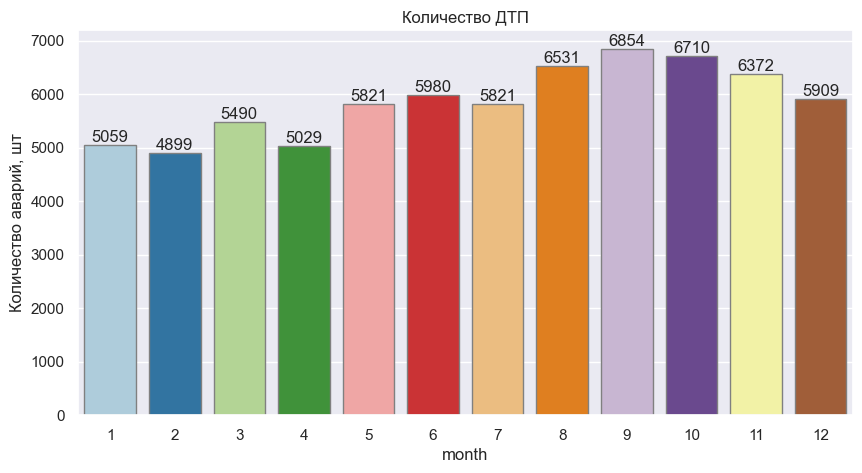

Максимальное значение ДТП= 6854 шт. в 9, 
минимальное = 4899 шт. в 2
------------------------------------------------------

По критерию "season"


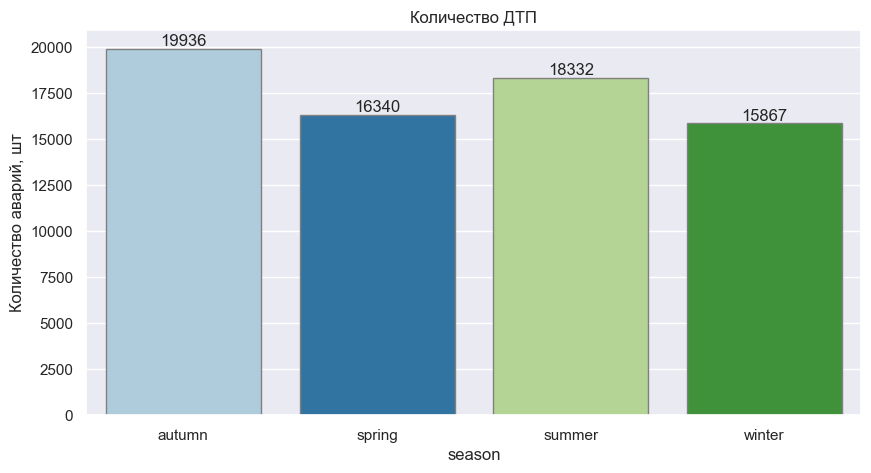

Максимальное значение ДТП= 19936 шт. в autumn, 
минимальное = 15867 шт. в winter
------------------------------------------------------


In [32]:
sns.set(context='notebook', style='darkgrid', palette="Paired", 
        font='sans-serif', font_scale=1, color_codes=True, rc={'figure.figsize':(10,5)} ) 

criteria =['year', 'month', 'season']
def get_plot(criteria):
    for col in criteria:
        count_col = full.groupby(col).count().reset_index()
        print(f'\nПо критерию "{col}"')
        ax = sns.barplot(x=col, y='id', data=count_col, errwidth=0, edgecolor = "grey",)
        for i in ax.containers:
            ax.bar_label(i,)
        plt.title('Количество ДТП')
        plt.ylabel('Количество аварий, шт')
        plt.show()
        print('Максимальное значение ДТП= {} шт. в {}, \nминимальное = {} шт. в {}'.format(
            count_col['id'].max(), 
            count_col.iloc[count_col['id'].idxmax()][col],
            count_col['id'].min(),
            count_col.iloc[count_col['id'].idxmin()][col]))
        print('------------------------------------------------------')
get_plot(criteria)



По критерию "light"


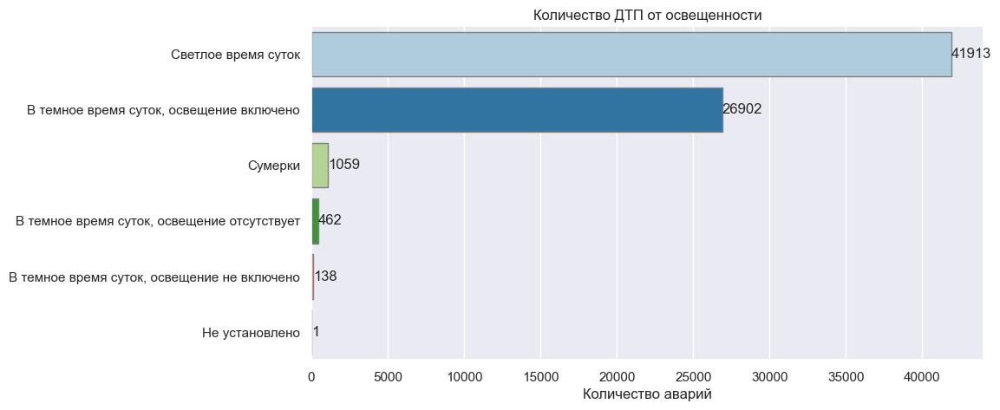

Максимальное значение ДТП= 41913 шт. в Светлое время суток, 
минимальное = 1 шт. в Не установлено
------------------------------------------------------


In [33]:
criteria =['light']
for col in criteria:
    count_col = full.groupby(col)['id'].count().sort_values(ascending=False).reset_index()
    ax = sns.barplot(x='id', y=col, data=count_col, errwidth=0, edgecolor = "grey",)
    for i in ax.containers:
        ax.bar_label(i,)
    print(f'\nПо критерию "{col}"')
    plt.title('Количество ДТП от освещенности')
    plt.xlabel('Количество аварий')
    plt.ylabel('')
    plt.show()
    print('Максимальное значение ДТП= {} шт. в {}, \nминимальное = {} шт. в {}'.format(
            count_col['id'].max(), 
            count_col.iloc[count_col['id'].idxmax()][col],
            count_col['id'].min(),
            count_col.iloc[count_col['id'].idxmin()][col]))
    print('------------------------------------------------------')

### Вывод:
- в разрезе 2015 по 2022 год. С годами количество ДТП по г. Москва уменьшается. Был небольшой подъем в 2019, но потом резкий спад.
- смена сезонов с лета на осень на графике по месяцам увеличивает количество ДТП. Максимум- в сентябре. В зимний период, некоторые пересаживаются на общественный транспорт, что в принципе снижается вероятность ДТП до минимума.
- что интересно, в светлое время суток- приходится максимальное количество ДТП. Вероятно это связано с социальной активность (человек пытается сделать дела, пока светло).

### 2. Внешние условия в момент ДТП. Когда происходит больше аварий и почему:
- **Водитель:**
    - Пол
    - В аварии какой степени тяжести попадают водители мужчины и водители женщины?
    - Стаж вождения
    - Категории ДТП

In [34]:
full.sample()

,id,light,region,scheme,category,datetime,severity,dead_count,injured_count,participants_count,role_1,gender_1,violations_1,health_status_1,year_vehicles,brand_vehicles,color_vehicles,model_vehicles,category_vehicles,role_vehicles,gender_vehicles,violations_vehicles,health_status_vehicles,years_of_driving_experience_vehicles,address,lat,long,year,month,season
18399,1545896,"В темное время суток, освещение включено",Нагорный,070,Столкновение,2017-04-28 19:47:00,Легкий,0,1,4,NaN,NaN,NaN,NaN,2016.0,LEXUS,Черный,Прочие модели Lexus,Прочие легковые автомобили,Водитель,Мужской,[Несоблюдение очередности проезда],Не пострадал,14.0,"г Москва, пр-кт Нахимовский, 4А СТР2",55.663845,37.610224,2017,4,spring


In [35]:
# Посмотрим виды ролей
print(full['role_1'].unique())
full['role_vehicles'].unique()

[nan 'Пешеход'
 'Пешеход, перед ДТП находившийся в (на) ТС в качестве водителя или пешеход, перед ДТП находившийся в (на) ТС в качестве пассажира'
 'Пассажир' 'Водитель']


array(['Водитель', 'Пассажир', 'Велосипедист', nan, 'Пешеход'],
      dtype=object)

,index,gender_vehicles
0,Мужской,46934
1,Женский,8608


Мужской    1
Name: gender_1, dtype: int64

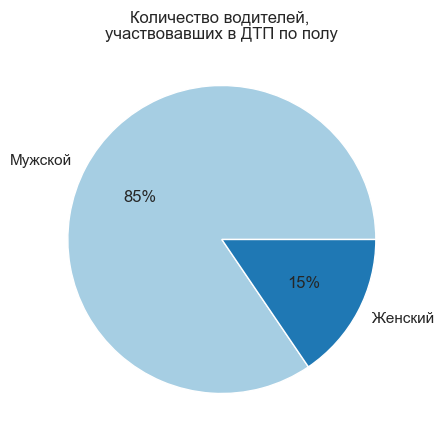

In [36]:
gender = pd.DataFrame(full.loc[full['role_vehicles'] == 'Водитель', 'gender_vehicles'].value_counts()).reset_index()
display(gender)
display(full.loc[full['role_1'] == 'Водитель', 'gender_1'].value_counts())
plt.pie(gender['gender_vehicles'], labels=gender['index'], autopct='%.0f%%')
plt.title('Количество водителей, \nучаствовавших в ДТП по полу')
plt.show()

- 85% водителей попавших в ДТП- мужчины

**В аварии какой степени тяжести попадают водители мужчины и водители женщины?**

In [37]:
# Опустим одно значение-водителя столбца 'role_1
s1 = full[['role_vehicles', 'gender_vehicles', 'gender_1', 'severity']]
s1 = s1.loc[(s1['role_vehicles'] == 'Водитель')].drop('role_vehicles', axis=1)
s1

,gender_vehicles,gender_1,severity
0,Мужской,NaN,Легкий
1,Мужской,NaN,Легкий
3,Мужской,NaN,Легкий
4,Мужской,NaN,Легкий
5,Мужской,NaN,Легкий
...,...,...,...
70467,Мужской,NaN,Легкий
70468,Мужской,NaN,Легкий
70470,Мужской,NaN,Легкий
70473,Мужской,NaN,Легкий


In [38]:
s2= s1.groupby(['severity', 'gender_vehicles'])['gender_vehicles', 'gender_1'].count()
s2['count'] = s2['gender_vehicles'] + s2['gender_1']
s2 = (
    s2
    .drop(columns={'gender_1', 'gender_vehicles'})
    .reset_index()
    .rename(columns={'gender_vehicles': 'gender'})
)
s2['%'] = round(s2['count'] / s2['count'].sum() *100, 1)
s2

C:\Users\nikit\AppData\Local\Temp\ipykernel_7804\833327933.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  s2= s1.groupby(['severity', 'gender_vehicles'])['gender_vehicles', 'gender_1'].count()


,severity,gender,count,%
0,Легкий,Женский,8349,11.0
1,Легкий,Мужской,45368,59.7
2,С погибшими,Женский,586,0.8
3,С погибшими,Мужской,3035,4.0
4,Тяжёлый,Женский,2860,3.8
5,Тяжёлый,Мужской,15756,20.7


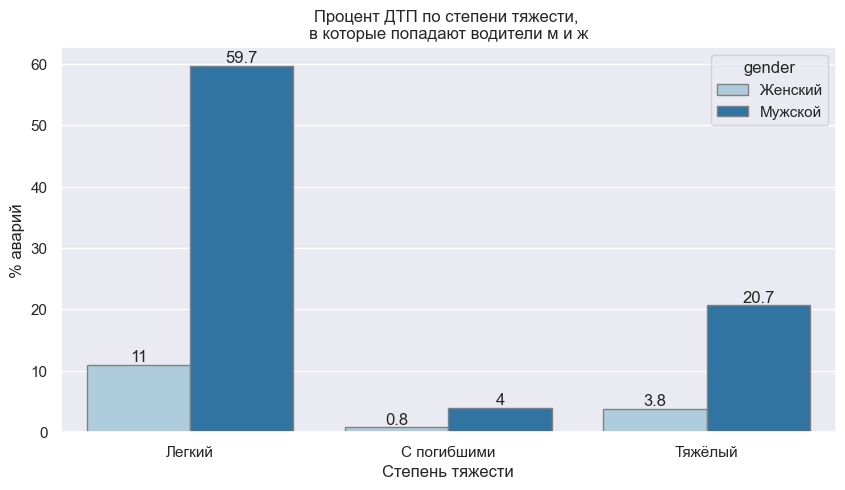

In [39]:
ax = sns.barplot(y='%', x='severity', hue='gender', data=s2, errwidth=0, edgecolor = "grey",)
for i in ax.containers:
    ax.bar_label(i,)
plt.title('Процент ДТП по степени тяжести, \nв которые попадают водители м и ж')
plt.xlabel('Степень тяжести')
plt.ylabel('% аварий')
plt.show()

- 70% аварий, в которую попадают водители, имеют легкую степень тяжести, здесь мужчин- 60%.

**Посмотрим стаж вождения**

In [40]:
e1 = pd.DataFrame(full.loc[full['role_vehicles'] == 'Водитель', 'years_of_driving_experience_vehicles'].value_counts()).reset_index()
display(e1)
e2 = pd.DataFrame(full.loc[full['role_1'] == 'Водитель', 'years_of_driving_experience_vehicles'].value_counts()).reset_index()
e2

,index,years_of_driving_experience_vehicles
0,5.0,2532
1,1.0,2363
2,3.0,2353
3,2.0,2259
4,4.0,2249
...,...,...
59,59.0,5
60,62.0,5
61,54.0,5
62,63.0,3


,index,years_of_driving_experience_vehicles
0,15.0,2
1,12.0,1
2,5.0,1
3,32.0,1
4,18.0,1
5,3.0,1


In [41]:
experience = e1.merge(e2, how='left', on='index').fillna(0)
experience

,index,years_of_driving_experience_vehicles_x,years_of_driving_experience_vehicles_y
0,5.0,2532,1.0
1,1.0,2363,0.0
2,3.0,2353,1.0
3,2.0,2259,0.0
4,4.0,2249,0.0
...,...,...,...
59,59.0,5,0.0
60,62.0,5,0.0
61,54.0,5,0.0
62,63.0,3,0.0


In [42]:
experience['count'] = experience['years_of_driving_experience_vehicles_x']+ experience['years_of_driving_experience_vehicles_y']
experience = (
    experience
    .drop(['years_of_driving_experience_vehicles_x','years_of_driving_experience_vehicles_y'], axis=1)
    .rename(columns={'index': 'years_experience'})
    .sort_values(by='years_experience', ascending=True)
    .reset_index(drop=True)
)
experience

,years_experience,count
0,1.0,2363.0
1,2.0,2259.0
2,3.0,2354.0
3,4.0,2249.0
4,5.0,2533.0
...,...,...
59,60.0,7.0
60,61.0,6.0
61,62.0,5.0
62,63.0,3.0


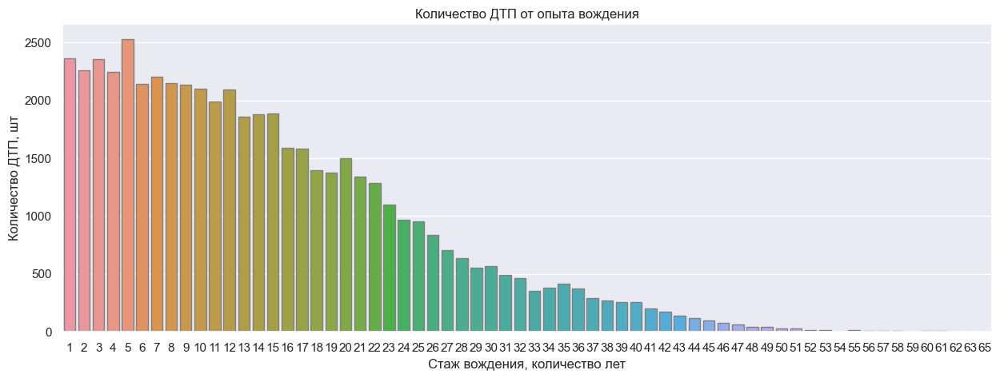

In [43]:
experience['years_experience'] = experience['years_experience'].astype('int')

plt.figure(figsize=(15,5))
ax = sns.barplot(y='count',x='years_experience',  data=experience, errwidth=0, edgecolor = "grey",)
#ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
#plt.xticks(rotation=45)
plt.title('Количество ДТП от опыта вождения')
plt.xlabel('Стаж вождения, количество лет')
plt.ylabel('Количество ДТП, шт')
plt.show()


- Основной тренд- чем больше опыт, тем меньше ДТП. Но есть исключения- это подъем в количестве событий при стаже 5.

**Посмотрим категории ДТП**

In [44]:
cat1 = (
    pd.DataFrame(full['category'].value_counts())
    .reset_index()
    .rename(columns={'index': 'category', 'category': 'count'})
)
cat1['%'] = round(cat1['count'] / cat1['count'].sum() *100, 1)


cat1

,category,count,%
0,Столкновение,31637,44.9
1,Наезд на пешехода,24738,35.1
2,Наезд на препятствие,3966,5.6
3,Падение пассажира,3338,4.7
4,Наезд на стоящее ТС,3333,4.7
5,Наезд на велосипедиста,2268,3.2
6,Опрокидывание,826,1.2
7,Съезд с дороги,94,0.1
8,"Наезд на лицо, не являющееся участником дорожного движения, осуществляющее производство работ",65,0.1
9,Иной вид ДТП,61,0.1


In [45]:
# Выделим отдельную категорию с % меньше 1
cat1.loc[cat1['%'] < 1, 'category'] = 'Другие категории'
cat2 = (
    cat1
    .groupby('category')
    ['count', '%'].sum()
    .sort_values(by='%', ascending=False)
    .reset_index()
)
cat2

C:\Users\nikit\AppData\Local\Temp\ipykernel_7804\1866599020.py:4: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  cat1


,category,count,%
0,Столкновение,31637,44.9
1,Наезд на пешехода,24738,35.1
2,Наезд на препятствие,3966,5.6
3,Наезд на стоящее ТС,3333,4.7
4,Падение пассажира,3338,4.7
5,Наезд на велосипедиста,2268,3.2
6,Опрокидывание,826,1.2
7,Другие категории,369,0.5


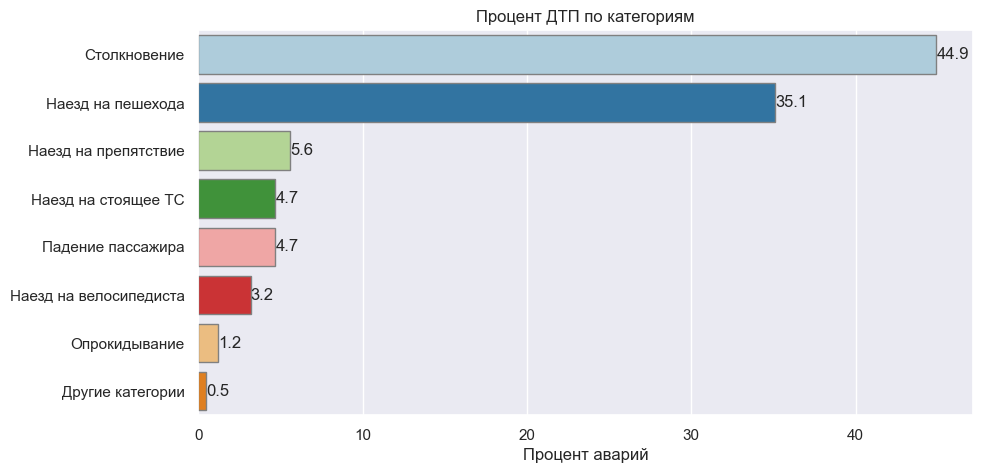

In [46]:
ax = sns.barplot(y='category', x='%', data=cat2, errwidth=0, edgecolor = "grey",)
for i in ax.containers:
    ax.bar_label(i,)
plt.title('Процент ДТП по категориям')
plt.xlabel('Процент аварий')
plt.ylabel('')
plt.show()

- почти половина - 45% ДТП - это столкновение! На втором месте- наезд на пешехода- 35% -это очень много.

### Вывод
- 85% водителей попавших в ДТП- мужчины,
- 70% аварий, в которую попадают водители, имеют легкую степень тяжести, здесь мужчин- 60%.
- Основной тренд- чем больше опыт, тем меньше ДТП. Но есть исключения- это подъем в количестве событий при стаже 5 лет.
- Почти половина - 45% ДТП - это столкновение! На втором месте- наезд на пешехода- 35% -это очень много.

### 3. Ситуация в городе:
- В каких районах города происходит больше всего ДТП? (причины)
- Посмотреть в динамике, в каких районах количество аварий сокращается, а где увеличивается (можно выделить топ-5 районов)
- В каких районах было больше случаев со смертельным исходом и почему. В каких меньше.
- В каких районах города участники ДТП чаще получают травмы?


In [47]:
r1 = full[['region', 'id', 'severity', 'dead_count', 'injured_count', 'year']]
r1

,region,id,severity,dead_count,injured_count,year
0,Академический,1536114,Легкий,0,1,2017
1,Бабушкинский,1559595,Легкий,0,1,2015
2,Дорогомилово,1566401,Легкий,0,1,2017
3,Братеево,1561317,Легкий,0,1,2015
4,Дмитровский,1549301,Легкий,0,1,2017
...,...,...,...,...,...,...
70470,Измайлово,1533025,Легкий,0,1,2020
70471,Южное Бутово,1536828,Тяжёлый,0,1,2019
70472,Краснопахорское поселение,1527938,С погибшими,1,0,2018
70473,Тверской,1530188,Легкий,0,2,2018


В каких районе города происходит больше всего ДТП? 

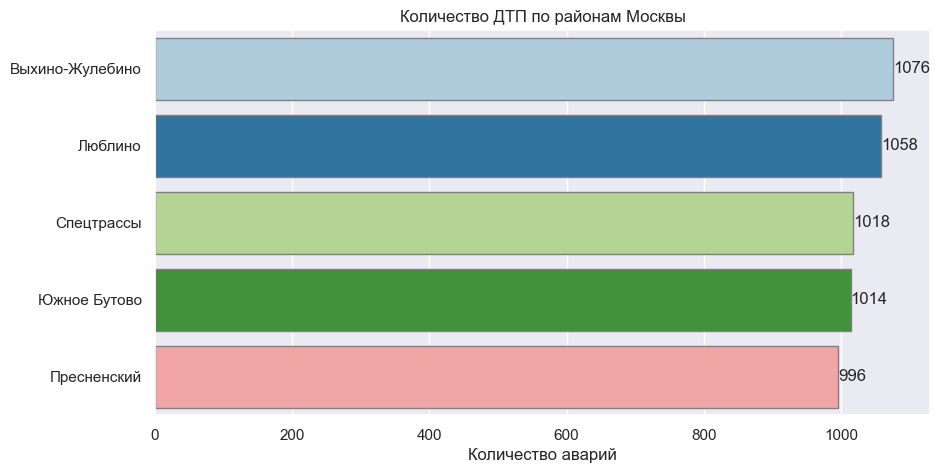

In [48]:
# Выделим топ 5 районов по ДТП
r2 = pd.DataFrame(r1.groupby('region')['id'].count().sort_values(ascending=False).reset_index())[:5]
ax = sns.barplot(y='region', x='id', data=r2, errwidth=0, edgecolor = "grey",)
for i in ax.containers:
    ax.bar_label(i,)
plt.title('Количество ДТП по районам Москвы')
plt.xlabel('Количество аварий')
plt.ylabel('')
plt.show()

- Тройка лидеров по максимому ДТП за 7 лет возглавил район Выхино-Жулебино, потом Люблино и Спецтрассы.

**Посмотреть в динамике, в каких районах количество аварий сокращается, а где увеличивается** 

In [49]:
# Выделим топ 5 районов
top5 = list(r2['region'])
r3 = (
    r1
    .query('region == @top5')
    .pivot_table(index='year', columns='region', values='id', aggfunc='count')
)
r3

region,Выхино-Жулебино,Люблино,Пресненский,Спецтрассы,Южное Бутово
year,,,,,
2015,123,146,117,145,181
2016,107,112,101,132,128
2017,117,114,122,111,131
2018,138,150,110,116,108
2019,172,174,132,140,131
2020,139,143,143,127,109
2021,153,128,153,116,124
2022,127,91,118,131,102


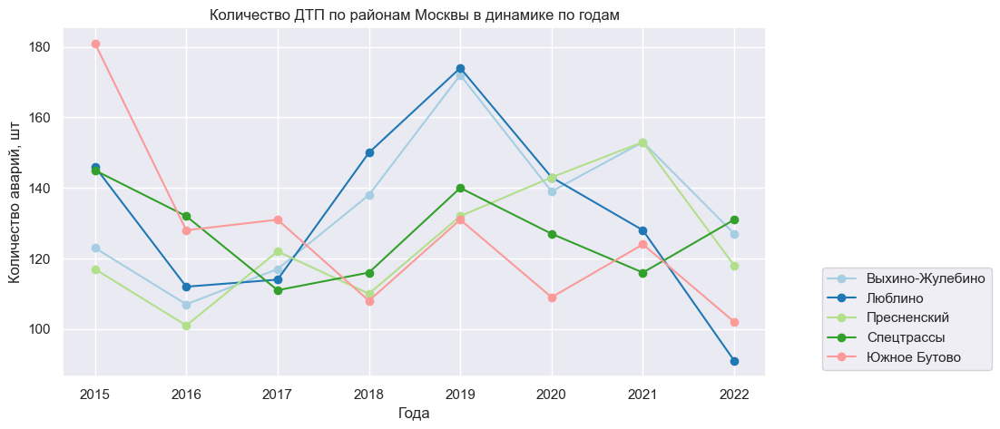

In [50]:
r3.plot(grid=True, style='o-') 

plt.title('Количество ДТП по районам Москвы в динамике по годам')
plt.ylabel('Количество аварий, шт')
plt.xlabel('Года')
plt.legend(loc='lower center', bbox_to_anchor=(1.2, 0.0))
plt.show()

- В 2015 году максимум аварий было в Южном Бутово, а минимум у Пресненского района. К 2022 году верхний диапазон аварий снизился ниже середины 2015 года, а минимум стал у района Люблино.

**В каких районах было больше случаев со смертельным исходом и почему. В каких меньше.**

In [51]:
r4 = r1.pivot_table(index='region', values='dead_count', aggfunc='sum').sort_values(by='dead_count', ascending=False)
r4_max = r4.head(5)
display(r4_max)
r4_min = r4.tail(5)
r4_min

,dead_count
region,
Спецтрассы,85
Сосенское,63
Выхино-Жулебино,62
Дорогомилово,62
Люблино,60


,dead_count
region,
Ростокино,4
Восточное Дегунино,3
Старое Крюково,3
Поселок Восточный,2
Кокошкино,2


- есть две гипотезы: 
    - 1- это зависит от расположения. 
    - 2- это населенность районов. Чем выше население, тем больше вероятность аварии.

**В каких районах города участники ДТП чаще получают травмы?**

In [52]:
r5 = r1.pivot_table(index='region', values='injured_count', aggfunc='sum').sort_values(by='injured_count', ascending=False)
r5

,injured_count
region,
Выхино-Жулебино,1276
Спецтрассы,1241
Люблино,1237
Южное Бутово,1225
Гольяново,1105
...,...
Михайлово-Ярцевское поселение,97
Воскресенское,70
Кокошкино,30


- районы, где больше всего аварий, там и больше всего травм.

### Вывод:
- Тройка лидеров по максимому ДТП за 5 лет возглавил район Выхино-Жулебино, потом Люблино и Спецтрассы.
- В 2015 году максимум аварий было в Южном Бутово, а минимум у Пресненского района. К 2022 году верхний диапазон аварий снизился ниже середины 2015 года, а минимум стал у района Гольяново.
- населенность районов, географическое расположение района влияют на количество аварий и получение травм или смертельный исход.

## 4. Визуализация на карте 
- Визуализировать на карте ДТП в городе с помощью heatmap (за все время):
    - Районы по количеству ДТП
- Визуализировать на карте ДТП района точками за год:
    - Аварии по сезонам
    - Аварии, где водитель мужчина и водитель женщины
    - Аварии по степени тяжести

In [53]:
mo = gpd.read_file('mo.geojson')
mo.info()
mo.sample()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 146 entries, 0 to 145
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   NAME       146 non-null    object  
 1   OKATO      146 non-null    object  
 2   OKTMO      146 non-null    object  
 3   NAME_AO    146 non-null    object  
 4   OKATO_AO   146 non-null    object  
 5   ABBREV_AO  146 non-null    object  
 6   TYPE_MO    146 non-null    object  
 7   geometry   146 non-null    geometry
dtypes: geometry(1), object(7)
memory usage: 9.2+ KB


,NAME,OKATO,OKTMO,NAME_AO,OKATO_AO,ABBREV_AO,TYPE_MO,geometry
84,Бутырский,45280561,45353000,Северо-Восточный,45280000,СВАО,Муниципальный округ,"POLYGON ((37.57357 55.83132, 37.57365 55.83172, 37.57376 55.83209, 37.57389 55.83239, 37.57415 55.83286, 37.57444 55.83330, 37.57508 55.83398, 37...."


In [54]:
mo_map = (
    mo
    .drop(columns={'OKATO', 'OKTMO', 'NAME_AO', 'OKATO_AO', 'ABBREV_AO', 'TYPE_MO'})
    .rename(columns={'NAME': 'region'})
)
mo_map.sample()

,region,geometry
103,Царицыно,"POLYGON ((37.62509 55.64001, 37.62543 55.64001, 37.62568 55.64001, 37.62610 55.64000, 37.62683 55.64000, 37.62747 55.63993, 37.62778 55.63979, 37...."


In [55]:
region = (
    r1.groupby('region')['id'].count().reset_index()
    .merge(mo_map[['geometry', 'region']], on = 'region')
    .drop_duplicates(['region'])
)
region.head(1)

,region,id,geometry
0,Академический,511,"POLYGON ((37.55226 55.68403, 37.55232 55.68408, 37.55256 55.68428, 37.55261 55.68432, 37.55265 55.68435, 37.55353 55.68504, 37.55410 55.68549, 37...."


In [56]:
# Уберем пропуски в локации
full_df = full.loc[full['lat'].notna()]
full_df.sample()

,id,light,region,scheme,category,datetime,severity,dead_count,injured_count,participants_count,role_1,gender_1,violations_1,health_status_1,year_vehicles,brand_vehicles,color_vehicles,model_vehicles,category_vehicles,role_vehicles,gender_vehicles,violations_vehicles,health_status_vehicles,years_of_driving_experience_vehicles,address,lat,long,year,month,season
12765,2689632,"В темное время суток, освещение включено",Обручевский,740,Наезд на пешехода,2022-06-14 20:25:00,Легкий,0,1,2,NaN,NaN,NaN,NaN,2011.0,RENAULT,Серый,Прочие модели Renault,"С-класс (малый средний, компактный) до 4,3 м",Водитель,Мужской,[],"Раненый, находящийся (находившийся) на амбулаторном лечении, либо которому по характеру полученных травм обозначена необходимость амбулаторного л...",11.0,"г Москва, ул Обручева, 16 к.1",55.659347,37.514684,2022,6,summer


### 4.1 Визуализировать на карте ДТП в городе с помощью heatmap (за все время):
- Районы по количеству ДТП

In [57]:
from folium.plugins import HeatMap
m = folium.Map(location=[55.755864, 37.617698], zoom_start = 10, tiles = 'cartodbpositron', control_scale=True) 
# heatmap
lat = full_df.lat.tolist()
lng = full_df.long.tolist()
HeatMap(list(zip(lat, lng))).add_to(m)

# Добавим районы к карте
for _, r in region.iterrows():
    geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geojson = geo.to_json()
    geojson = folium.GeoJson(data=geojson)
   
    folium.Popup(str(r['region']) +': ' + str(r['id']) + ' accidents for all period').add_to(geojson)
    geojson.add_to(m)
m

- чем темнее пятно, тем больше аварий. Вся Москва красная. Есть полигоны с неопределенными районами

Сложно здесь сделать какие-то выводы. Хорошо бы посмотреть количество смертей после ДТП

In [58]:
# Найдем координаты ДТП с летальным исходом
d1 = (
    full_df
    .groupby(['region', 'lat', 'long'])
    ['dead_count'].count()
    .reset_index()
)
d1.head(3)

,region,lat,long,dead_count
0,Академический,54.6897,37.5667,1
1,Академический,55.0000,37.0000,1
2,Академический,55.1019,37.9447,1


In [59]:
d1_region = (
    d1
    .groupby('region')
    ['dead_count'].sum()
    .reset_index()
    .merge(mo_map[['geometry', 'region']], on = 'region')
    .drop_duplicates(['region'])
)
d1_region.sample()

,region,dead_count,geometry
37,Клёновское,121,"POLYGON ((37.23363 55.29922, 37.23491 55.30230, 37.23669 55.30142, 37.23841 55.30157, 37.23955 55.30253, 37.23931 55.30524, 37.24103 55.30522, 37...."


In [60]:
region = list(d1_region['region'])
deaths = list(d1_region['dead_count'])
def color_producer(deaths):
    if deaths >= 100:
        return 'green'
    elif deaths >= 600:
        return 'orange'
    else:
        return 'red'

m = folium.Map(location=[55.755864, 37.617698], zoom_start = 10, tiles = 'cartodbpositron', control_scale=True) 


# Добавим районы к карте
for _, r in d1_region.iterrows():
    geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geojson = geo.to_json()
    geojson = folium.GeoJson(data=geojson)
    folium.Popup(str(r['region']) +': ' + str(r['dead_count']) + ' deaths for all period').add_to(geojson)
    geojson.add_to(m)
m

Хотелось бы, что районы сами были разноцветные. Тогда точки не нужны были. Они не информативные. Кластеризация разбивает не по границам районов

Попробовала сделать другим модулем. Но не смогла подгрузить json к geo_data. Думаю, поэтому не получилось и key_on нет

In [61]:
m = folium.Map(location=[55.755864, 37.617698], zoom_start = 10, tiles = 'cartodbpositron', control_scale=True) 

folium.Choropleth(
    geo_data=mo_map,
    name="Летальность",
    data=d1_region,
    columns=['region',	'dead_count'],
    #key_on=full_df.id,
    fill_color="YlOrBr",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Летальность",
    show = False,  
).add_to(m)

folium.LayerControl().add_to(m)

m

### 4.2. Визуализировать на карте ДТП района точками за 2021 год:
- Аварии по сезонам

In [62]:
# Поскольку за 2022 год данные не полные (год еще не закончился), возьмем за 2021
from folium.plugins import MarkerCluster
m = folium.Map(location=[55.755864, 37.617698], zoom_start = 10, tiles = 'cartodbpositron', control_scale=True) 
mCluster1 = MarkerCluster(name = 'spring 2021').add_to(m)
lat1 = full_df.query('season == "spring" and year == 2021').lat.tolist()
lng1 = full_df.query('season == "spring" and year == 2021').long.tolist()
location1 = list(zip(lat1, lng1))
for point in range(0, len(location1)):
    folium.Marker(location1[point]).add_to(mCluster1)
            
mCluster2 = MarkerCluster(name = 'summer 2021').add_to(m)
lat2 = full_df.query('season == "summer" and year == 2021').lat.tolist()
lng2 = full_df.query('season == "summer" and year == 2021').long.tolist()
location2 = list(zip(lat2, lng2))
for point in range(0, len(location2)):
    folium.Marker(location2[point]).add_to(mCluster2)
    
mCluster3 = MarkerCluster(name = 'autumn 2021').add_to(m)
lat3 = full_df.query('season == "autumn" and year == 2021').lat.tolist()
lng3 = full_df.query('season == "autumn" and year == 2021').long.tolist()
location3 = list(zip(lat3, lng3))
for point in range(0, len(location3)):
    folium.Marker(location3[point]).add_to(mCluster3)
    
mCluster4 = MarkerCluster(name = 'winter 2021').add_to(m)
lat4 = full_df.query('season == "winter" and year == 2021').lat.tolist()
lng4 = full_df.query('season == "winter" and year == 2021').long.tolist()
location4 = list(zip(lat4, lng4))
for point in range(0, len(location4)):
    folium.Marker(location4[point]).add_to(mCluster4)
folium.LayerControl(collapsed=True).add_to(m)

m

- чем дальше от Москвы, тем меньше аварий- зеленый маркер. Ближе к центру- красные маркеры и количество ДТП большое.

**Аварии, где водитель мужчина и водитель женщины**

In [63]:
region_2021 = (
    full_df
    .query('year == 2021')
    .groupby(['region', 'gender_vehicles'])
    ['id'].count()
    .reset_index()
)
region_2021.head(1)

,region,gender_vehicles,id
0,Академический,Женский,15


In [64]:
region_2021['gender'] = region_2021['gender_vehicles'] + ': ' + region_2021['id'].astype('str')  + ' accidents'

gender_2021 = (
    region_2021
    .groupby('region')
    ['gender'].unique()
    .reset_index()
    .merge(mo_map[['geometry', 'region']], on = 'region')
    .drop_duplicates(['region'])
)
gender_2021.sample()

,region,gender,geometry
45,Крюково,"[Женский: 15 accidents, Мужской: 41 accidents]","POLYGON ((37.14409 55.98988, 37.14453 55.98995, 37.14471 55.98998, 37.14578 55.99014, 37.14609 55.99048, 37.14723 55.99094, 37.14784 55.99080, 37...."


In [65]:
lat = list(full_df.query('year == 2021')['lat'])
long = list(full_df.query('year == 2021')['long'])
gender = list(full_df.query('year == 2021')['gender_vehicles'])
def color_producer(gender):
    if gender ==  'Мужской':
        return 'blue'
    else:
        return 'red'

m = folium.Map(location=[55.755864, 37.617698], zoom_start = 10, tiles = 'cartodbpositron', control_scale=True) 
gend = folium.FeatureGroup(name='Gender')

for lt, ln, gender in zip(lat, long, gender):
    gend.add_child(folium.CircleMarker(location=[lt, ln], radius = 0.5, 
                fill_color=color_producer(gender), fill=True,  
                color = color_producer(gender), fill_opacity=0.7))
m.add_child(gend)

# Добавим районы к карте
for _, r in gender_2021.iterrows():
    geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geojson = geo.to_json()
    geojson = folium.GeoJson(data=geojson)
   
    folium.Popup(str(r['region']) +': ' + str(r['gender'])).add_to(geojson)
    geojson.add_to(m)
m

**Аварии по степени тяжести**

In [66]:
s_2021 = (
    full_df
    .query('year == 2021')
    .groupby(['region', 'severity'])
    ['id'].count()
    .reset_index()
)
s_2021.head(1)

,region,severity,id
0,Академический,Легкий,31


In [67]:
s_2021['severity_id'] = s_2021['severity'] + ': ' + s_2021['id'].astype('str')  + ' accidents'

s_21_merge = (
    s_2021
    .groupby('region')
    ['severity_id'].unique()
    .reset_index()
    .merge(mo_map[['geometry', 'region']], on = 'region')
    .drop_duplicates(['region'])
)
s_21_merge.sample()

,region,severity_id,geometry
41,Косино-Ухтомский,"[Легкий: 69 accidents, С погибшими: 1 accidents, Тяжёлый: 1 accidents]","POLYGON ((37.83602 55.70978, 37.83620 55.71008, 37.83653 55.71068, 37.83777 55.71312, 37.83819 55.71401, 37.83836 55.71448, 37.83861 55.71552, 37...."


In [68]:
lat = list(full_df.query('year == 2021')['lat'])
long = list(full_df.query('year == 2021')['long'])
severity = list(full_df.query('year == 2021')['severity'])
def color_producer(severity):
    if severity ==  'Легкий':
        return 'green'
    elif severity ==  'Тяжёлый':
        return 'red'
    else:
        return 'orange'

m = folium.Map(location=[55.755864, 37.617698], zoom_start = 10, tiles = 'cartodbpositron', control_scale=True) 
sev = folium.FeatureGroup(name='Severity')

for lt, ln, severity in zip(lat, long, severity):
    sev.add_child(folium.CircleMarker(location=[lt, ln], radius = 0.5, 
                fill_color=color_producer(severity), fill=True,  
                color = color_producer(severity), fill_opacity=0.7))
m.add_child(sev)

# Добавим районы к карте
for _, r in s_21_merge.iterrows():
    geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geojson = geo.to_json()
    geojson = folium.GeoJson(data=geojson)
    folium.Popup(str(r['region']) +': ' + str(r['severity_id'])).add_to(geojson)
    geojson.add_to(m)
m

## Общие выводы:
1)
- в разрезе 2015 по 2022 год. С годами количество ДТП по г. Москва уменьшается. Был небольшой подъем в 2019, но потом резкий спад.
- смена сезонов с лета на осень на графике по месяцам увеличивает количество ДТП. Максимум- в сентябре. В зимний период, некоторые пересаживаются на общественный транспорт, что в принципе снижается вероятность ДТП до минимума.
- что интересно, в светлое время суток- приходится максимальное количество ДТП. Вероятно это связано с социальной активность (человек пытается сделать дела, пока светло).

2)
- 85% водителей попавших в ДТП- мужчины,
- 70% аварий, в которую попадают водители, имеют легкую степень тяжести, здесь мужчин- 60%.
- Основной тренд- чем больше опыт, тем меньше ДТП. Но есть исключения- это подъем в количестве событий при стаже 5 лет.
- Почти половина - 45% ДТП - это столкновение! На втором месте- наезд на пешехода- 35% -это очень много.

3)
- Тройка лидеров по максимому ДТП за 5 лет возглавил район Выхино-Жулебино, потом Люблино и Спецтрассы.
- В 2015 году максимум аварий было в Южном Бутово, а минимум у Пресненского района. К 2022 году верхний диапазон аварий снизился ниже середины 2015 года, а минимум стал у района Гольяново.
- населенность районов, географическое расположение района влияют на количество аварий и получение травм или смертельный исход.

